# **1. Télécharger et Extraire les Données**


Dans cette étape, je vais télécharger les fichiers ZIP contenant les images et les annotations depuis mon ordinateur vers Google Colab, puis les extraire.

In [ ]:
from google.colab import files
import zipfile
import os

# Télécharger les fichiers zip contenant les données
uploaded = files.upload()

# Supposons que les fichiers sont téléchargés sous forme de fichiers zip
for file_name in uploaded.keys():
    with zipfile.ZipFile(file_name, 'r') as zip_ref:
        zip_ref.extractall('/content/IFN_ENIT')

# Définir les chemins des données
data_path = '/content/IFN_ENIT'

Saving ifnenit-database-demo.zip to ifnenit-database-demo.zip


# **2. Explorer la Structure des Dossiers**

je vais explorer la structure des dossiers pour voir où se trouvent les images et les annotations. Cela m'aidra à comprendre l'organisation des fichiers.

In [ ]:


# Explorer la structure des dossiers
for root, dirs, files in os.walk(data_path):
    level = root.replace(data_path, '').count(os.sep)
    indent = ' ' * 4 * (level)
    print(f'{indent}{os.path.basename(root)}/')
    subindent = ' ' * 4 * (level + 1)
    for f in files:
        print(f'{subindent}{f}')

IFN_ENIT/
    README.txt
    doc/
        page_writer_tab_set_X.README
        arabic_label_to_latin_label_lookup_table_plus_statistic.pdf
        tunisian_town_village_list.pdf
        page_writer_tab_set_d.txt
        page_writer_tab_set_c.txt
        page_writer_tab_set_b.txt
        page_writer_tab_set_a.txt
        README.pdf
    data/
        set_a/
            tru/
                ae77_047.tru
                ae70_002.tru
                ae19_055.tru
                ai46_015.tru
                af03_014.tru
                ae70_040.tru
                ae97_011.tru
                ae19_042.tru
                ae77_004.tru
                ai46_020.tru
                ae70_013.tru
                ae19_023.tru
                ae07_050.tru
                ae19_032.tru
                af03_012.tru
                ae70_004.tru
                ae77_033.tru
                af03_021.tru
                ae07_049.tru
                ai46_019.tru
                ae70_033.tru
                

# **3. Charger et Visualiser les Images**

L'objectif ici est de lire quelques images du dataset et de les afficher pour vérifier qu'elles ont été correctement chargées.

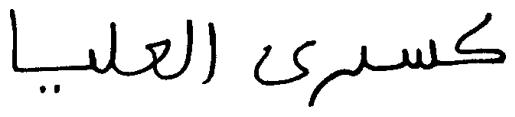

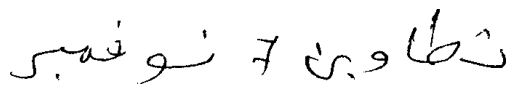

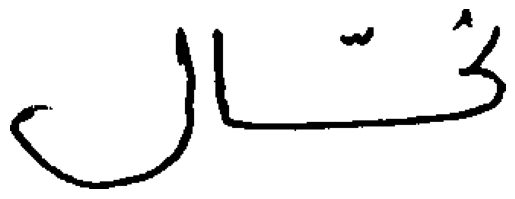

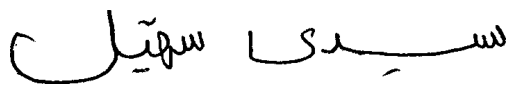

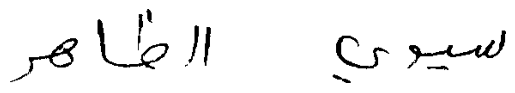

In [ ]:
import cv2
import matplotlib.pyplot as plt
import glob

# Fonction pour charger les images
def load_images_from_folder(folder, extension='bmp'):
    images = []
    for filename in glob.glob(f'{folder}/*.{extension}'):
        img = cv2.imread(filename)
        if img is not None:
            images.append(img)
    return images

# Charger les images BMP du set_a
bmp_images = load_images_from_folder(os.path.join(data_path, 'data/set_a/bmp'))

# Visualiser quelques images
for img in bmp_images[:5]:
    plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    plt.axis('off')
    plt.show()

# **4. Charger et Analyser les Fichiers d'Annotation**

Les fichiers ".tru" contiennent les annotations. je vais les lire et analyser leur contenu pour comprendre comment les données sont annotées.

In [ ]:
import glob
import os

# Fonction pour charger les fichiers d'annotation avec un encodage alternatif
def load_annotations_from_folder(folder, encoding='latin1'):
    annotations = {}
    for filename in glob.glob(f'{folder}/*.tru'):
        try:
            with open(filename, 'r', encoding=encoding) as file:
                annotations[os.path.basename(filename)] = file.readlines()
        except UnicodeDecodeError as e:
            print(f"Error decoding {filename}: {e}")
    return annotations

# Charger les annotations du set_a avec encodage 'latin1'
annotations = load_annotations_from_folder(os.path.join(data_path, 'data/set_a/tru'), encoding='latin1')

# Afficher quelques exemples d'annotations
for filename, lines in list(annotations.items())[:5]:
    print(f'Annotations for {filename}:')
    for line in lines:
        print(line.strip())
    print()

Annotations for ae77_047.tru:
COM: IFN/ENIT-database truth (label) file
COM: http://www.ifnenit.com
COM: IfN, TU-BS
COM: ae77_047.tif coming from pa385_3.tif
X_Y: 726 135
BDR: begin data record
LBL: ZIP:9114;AW1:ãäÒá.ÈæÒíøÇä;AW2:maB|naM|zaE|laA|baB|waE|zaA|yaBllL|aaE|naA|;QUA:YB1;ADD:P6
CHA: 10
BLN: 76,76
EDR: end of data record

Annotations for ae70_002.tru:
COM: IFN/ENIT-database truth (label) file
COM: http://www.ifnenit.com
COM: IfN, TU-BS
COM: ae70_002.tif coming from pa346_1.tif
X_Y: 513 110
BDR: begin data record
LBL: ZIP:3085;AW1:Ãã.ÔæÔÉ;AW2:aeA|maA|shB|waE|shB|teE|;QUA:YB1;ADD:P4
CHA: 6
BLN: 69,65
EDR: end of data record

Annotations for ae19_055.tru:
COM: IFN/ENIT-database truth (label) file
COM: http://www.ifnenit.com
COM: IfN, TU-BS
COM: ae19_055.tif coming from pa094_6.tif
X_Y: 544 80
BDR: begin data record
LBL: ZIP:7072;AW1:ãäÒá.ÈæÑÞíÈÉ.ÇáäøÌÇÍ;AW2:maB|naM|zaE|laA|baB|waE|raA|kaB|yaM|baM|teE|aaA|laB|naMllL|jaM|aaE|haA|;QUA:YB1;ADD:P8
CHA: 17
BLN: 44,44
EDR: end of data re

# **Étape 5 : Prétraiter les Images**

Dans cette étape, je vais supprimer les zones blanches autour des mots et redimensionner les images à une taille fixe.

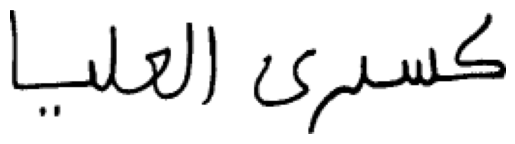

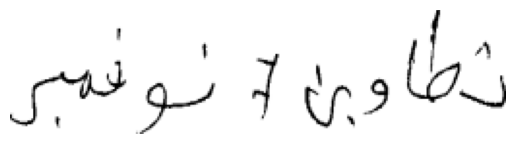

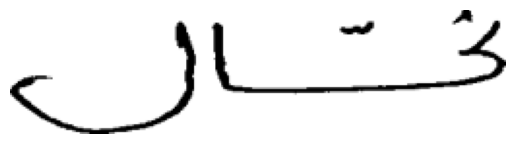

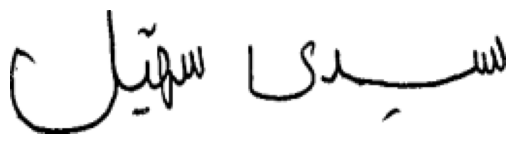

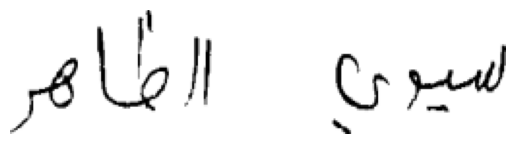

In [ ]:
def remove_whitespace(image):
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    _, thresh = cv2.threshold(gray, 240, 255, cv2.THRESH_BINARY)
    coords = cv2.findNonZero(255 - thresh)
    x, y, w, h = cv2.boundingRect(coords)
    return image[y:y+h, x:x+w]

def resize_image(image, size=(256, 64)):
    return cv2.resize(image, size, interpolation=cv2.INTER_AREA)

# Charger et prétraiter les images BMP du set_a
bmp_images = load_images_from_folder(os.path.join(data_path, 'data/set_a/bmp'))
preprocessed_images = [resize_image(remove_whitespace(img)) for img in bmp_images]

# Visualiser quelques images prétraitées
for img in preprocessed_images[:5]:
    plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    plt.axis('off')
    plt.show()

# **Étape 6 : Visualiser les Annotations**

Nous allons maintenant afficher les images et leurs annotations pour vérifier la précision des annotations.

## **6.1. Fonction pour extraire les informations d'annotation**

 Nous devons parser les informations d'annotation pour extraire les coordonnées des bounding boxes et les étiquettes.

In [ ]:
def parse_annotation(annotation):
    lines = annotation.split('\n')
    parsed_data = {}
    for line in lines:
        if line.startswith('X_Y:'):
            parsed_data['coords'] = line.split(': ')[1]
        elif line.startswith('LBL:'):
            parsed_data['labels'] = line.split(': ')[1]
    return parsed_data

## **6.2. Fonction pour dessiner les bounding boxes et les étiquettes sur les images**

In [ ]:
def draw_annotations(image, annotation_data):
    coords = list(map(int, annotation_data['coords'].split()))
    labels = annotation_data['labels'].split(';')

    x, y = coords
    for label in labels:
        if label.startswith('AW1:'):
            label_text = label.split(':')[1]
            cv2.putText(image, label_text, (x, y - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255, 0, 0), 2, cv2.LINE_AA)
            cv2.rectangle(image, (x, y), (x + 100, y + 40), (0, 255, 0), 2)
            break
    return image

## **6.3. Visualiser les annotations sur les images**

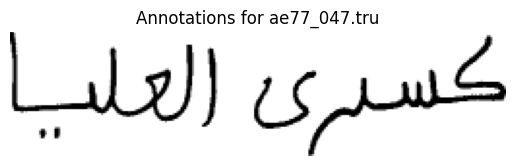

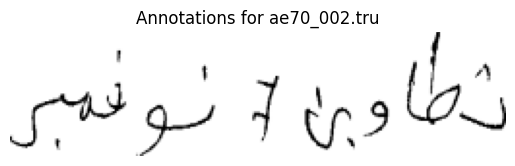

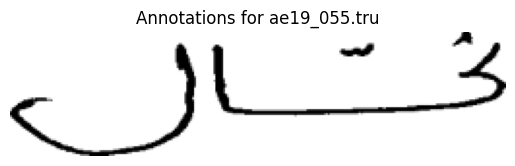

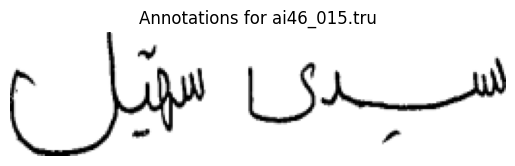

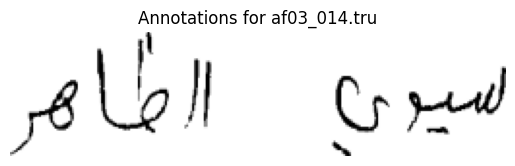

...

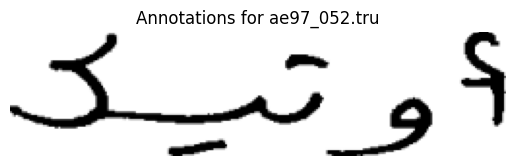

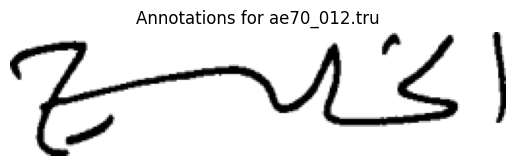

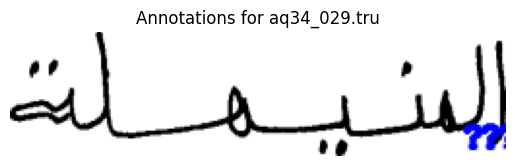

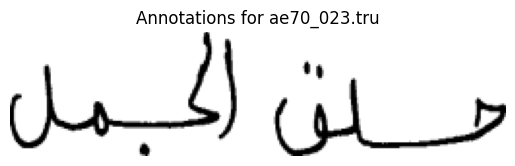

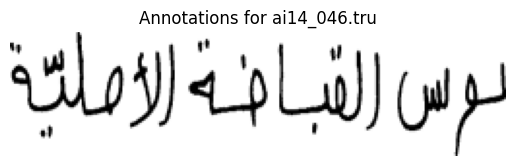

In [ ]:
# Charger les annotations du set_a avec encodage 'latin1'
annotations = load_annotations_from_folder(os.path.join(data_path, 'data/set_a/tru'), encoding='latin1')

# Visualiser les annotations sur les images
for img, (filename, annotation_lines) in zip(preprocessed_images, annotations.items()):
    annotation = '\n'.join(annotation_lines)
    parsed_data = parse_annotation(annotation)
    annotated_image = draw_annotations(img.copy(), parsed_data)
    plt.imshow(cv2.cvtColor(annotated_image, cv2.COLOR_BGR2RGB))
    plt.title(f'Annotations for {filename}')
    plt.axis('off')
    plt.show()